<img align="right" width="320" src="http://www.sobigdata.eu/sites/default/files/SoBigData_RI_3.png">

**Author:** [Daniele Fadda](https://kdd.isti.cnr.it/people/fadda-daniele), Salvatore Citraro

**Python version:**  3.x

<img align="right" width="250" src="https://upload.wikimedia.org/wikipedia/commons/thumb/c/c8/Cluster-2.svg/601px-Cluster-2.svg.png">

# Data Visualization with Python

This notebook contains an overview of basic visualization using the [matplotlib](https://matplotlib.org/) and [altair](https://altair-viz.github.io/) libraries.  
Note: this notebook is purposely not 100% comprehensive, it only discusses the basic things you need to get started.

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

# Glasgow Norms

In [3]:
df = pd.read_csv("../data/words_glasgow.csv")
df.head()

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
0,abattoir,8,4.200,2.864,4.333,5.455,4.391,2.382,6.760,4.652,5.391,0,160074.0
1,abbey,5,3.125,5.781,4.667,5.906,5.344,3.324,5.177,5.121,3.303,0,4224864.0
2,abbreviate,10,3.273,5.250,5.235,3.286,3.177,5.121,5.543,2.667,3.971,0,140105.0
3,abdicate,8,4.194,3.767,4.419,3.367,2.516,3.971,6.233,4.679,5.167,0,124123.0
4,abdication,10,3.846,3.880,4.800,3.292,2.571,3.097,6.407,5.083,4.571,0,128143.0


In [4]:
df_std = pd.read_csv("../data/glasgow_with_std.csv", skipinitialspace=True, sep=',')
df_std.head()

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,...,arousal_std,valence_std,dominance_std,concretness_std,imageability_std,familiarity_std,aoa_std,semsize_std,gender_std,Words
0,abattoir,8,4.200,2.864,4.333,5.455,4.391,2.382,6.760,4.652,...,2.400,1.740,1.285,1.900,2.121,1.799,0.427,1.549,1.170,abattoir
1,abbey,5,3.125,5.781,4.667,5.906,5.344,3.324,5.177,5.121,...,2.342,1.268,1.551,1.508,1.881,1.810,1.339,1.629,1.193,abbey
2,abbreviate,10,3.273,5.250,5.235,3.286,3.177,5.121,5.543,2.667,...,1.582,1.031,1.238,1.733,1.689,1.838,1.130,1.700,0.954,abbreviate
3,abdicate,8,4.194,3.767,4.419,3.367,2.516,3.971,6.233,4.679,...,1.941,1.383,2.182,1.853,1.521,2.077,0.844,1.441,1.186,abdicate
4,abdication,10,3.846,3.880,4.800,3.292,2.571,3.097,6.407,5.083,...,2.282,1.608,1.960,1.620,1.294,2.022,0.913,1.351,1.015,abdication


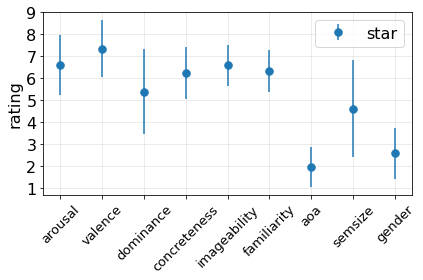

In [5]:
word_ex = df_std[df_std['word'] == 'star'].values

# 9 is the feature space cardinality
plt.errorbar(range(9), word_ex[:,2:-12][0].tolist(),
             yerr=word_ex[:,13:-1][0].tolist(), fmt='.',  label='star', ms=15)
                 
plt.legend(loc='best', fontsize=16)
plt.ylabel('rating', fontsize=16)
plt.xticks(range(len(df_std.columns.tolist()[2:-12])), df_std.columns.tolist()[2:-12], fontsize=13, rotation=45)
plt.yticks(fontsize=16)
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

# Matplotlib basic

Let's start with histograms. A **histogram** is a graphical representation of the distribution of data. It provides a visual summary of the underlying frequency or probability distribution of a dataset. Histograms are especially useful when working with continuous data and help us gain insights into patterns, trends, and outliers.

In a histogram:

- **X-axis (horizontal axis):** Represents the range of values or bins into which data is divided.
- **Y-axis (vertical axis):** Shows the frequency or count of data points falling within each bin.

Each bar in a histogram represents the count or frequency of data points within a specific range or bin. The bars are typically adjacent, with no gaps, as the data ranges are continuous.

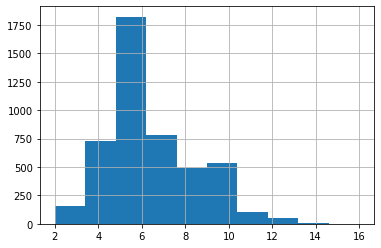

In [6]:
df['length'].hist()

plt.show()

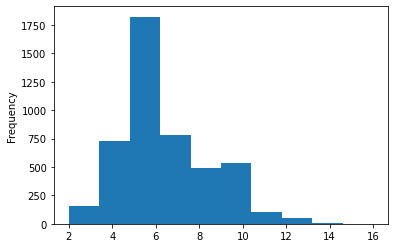

In [7]:
df['length'].plot(kind='hist')

plt.show()

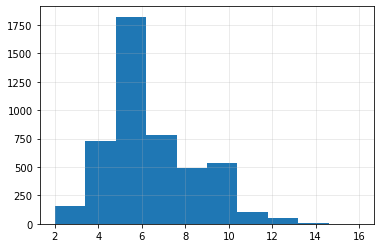

In [8]:
plt.hist(df['length'])

plt.grid(alpha=0.3)
plt.show()

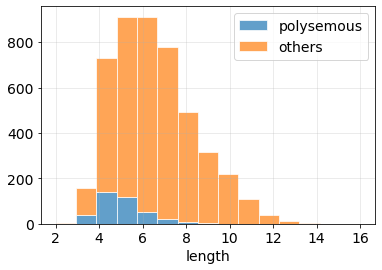

In [9]:
length_poly_words = df[df['polysemy'] == 1]['length']
length_other_words = df[df['polysemy'] == 0]['length']

plt.hist([length_poly_words, length_other_words], stacked=True, bins=15, label=['polysemous','others'],
         edgecolor='white', alpha=0.7)
plt.legend(loc='best', fontsize=14)
plt.xlabel('length', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(alpha=0.3)
plt.show()

Conversely, a **bar chart**, also known as a bar graph, is a graphical representation of categorical data. It displays data using rectangular bars or columns, where the length or height of each bar corresponds to the value it represents. Bar charts are particularly useful when comparing different categories or groups.

Key features of a bar chart:

- **X-axis (horizontal axis):** Represents categories or groups.
- **Y-axis (vertical axis):** Typically represents a measurement or count associated with each category.

Each bar in a bar chart represents a category, and the height or length of the bar represents the value associated with that category. Bar charts can be either horizontal or vertical, depending on the orientation.

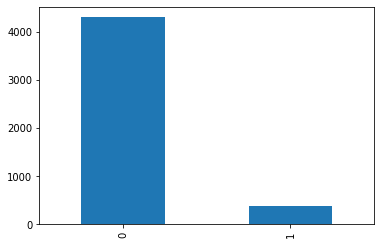

In [10]:
df['polysemy'].value_counts().plot(kind='bar')

plt.show()

A **scatter plot** is a two-dimensional data visualization technique used to display the relationship between two variables. Each data point in a scatter plot is represented as a point, marker, or dot, with its position determined by the values of the two variables being compared.

In a scatter plot:

- **X-axis (horizontal axis):** Represents one variable, often referred to as the independent variable.
- **Y-axis (vertical axis):** Represents the other variable, often referred to as the dependent variable.

The position of each data point on the scatter plot provides insights into how the two variables relate to each other. Scatter plots are particularly useful for identifying patterns, trends, clusters, outliers, and the strength of the relationship between variables.

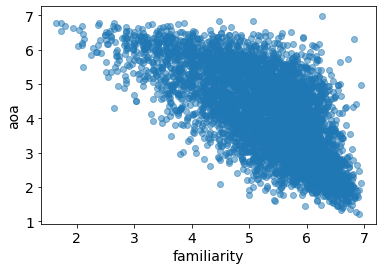

In [11]:
x = 'familiarity'
y = 'aoa'

plt.scatter(df[x], df[y], alpha=0.5)


plt.xlabel(x, fontsize=14)
plt.ylabel(y, fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

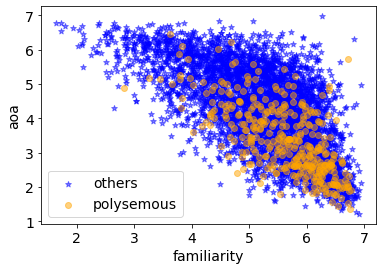

In [12]:
x = 'familiarity'
y = 'aoa'

plt.scatter(df[df['polysemy'] == 0][x], 
            df[df['polysemy'] == 0][y], color='b', marker='*', label='others', alpha=0.5)

plt.scatter(df[df['polysemy'] == 1][x], 
            df[df['polysemy'] == 1][y], color='orange', label='polysemous', alpha= 0.5)

plt.xlabel(x, fontsize=14)
plt.ylabel(y, fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='best', fontsize=14)
plt.show()

In [13]:
df['concreteness'].corr(df['imageability'])

0.9093045444189616

In [14]:
corr = df.corr()

In [15]:
corr.style.background_gradient(cmap='coolwarm')

,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
length,1.000000,0.158401,0.035209,0.005979,-0.199510,-0.204197,-0.118623,0.400869,0.310469,0.003397,-0.231101,-0.157720
arousal,0.158401,1.000000,0.326418,0.362653,-0.248671,-0.084990,0.180115,-0.005560,0.512953,-0.130571,-0.086200,-0.010100
valence,0.035209,0.326418,1.000000,0.723138,0.056234,0.092339,0.244815,-0.189220,0.066223,-0.397254,0.020664,0.136744
dominance,0.005979,0.362653,0.723138,1.000000,0.036157,0.068979,0.193922,-0.130277,0.085684,-0.077673,0.052000,0.102664
concreteness,-0.199510,-0.248671,0.056234,0.036157,1.000000,0.909305,0.094330,-0.381269,-0.406168,0.116861,0.113538,-0.037652
imageability,-0.204197,-0.084990,0.092339,0.068979,0.909305,1.000000,0.214810,-0.494037,-0.328131,0.042241,0.104248,-0.056132
familiarity,-0.118623,0.180115,0.244815,0.193922,0.094330,0.214810,1.000000,-0.672021,0.033043,-0.177483,0.105702,0.278419
aoa,0.400869,-0.005560,-0.189220,-0.130277,-0.381269,-0.494037,-0.672021,1.000000,0.232247,0.133803,-0.178988,-0.228596
semsize,0.310469,0.512953,0.066223,0.085684,-0.406168,-0.328131,0.033043,0.232247,1.000000,0.159873,-0.132842,0.080869
gender,0.003397,-0.130571,-0.397254,-0.077673,0.116861,0.042241,-0.177483,0.133803,0.159873,1.000000,0.024727,-0.036679


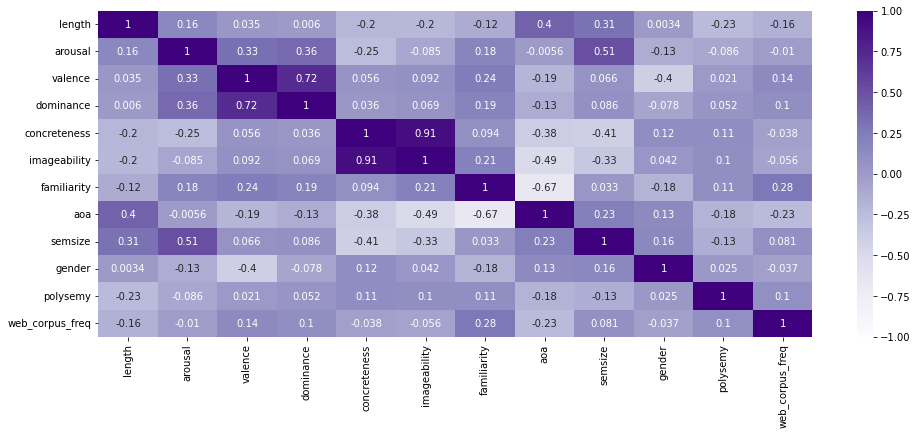

In [16]:
plt.figure(figsize=(16, 6))

sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='Purples')

plt.show()

A <b>box</b> plot typically consists of the following elements:

- **Box:** Represents the interquartile range (IQR), which spans from the first quartile (Q1) to the third quartile (Q3). It contains the middle 50% of the data.

- **Median Line:** A horizontal line inside the box represents the median (Q2), which is the middle value of the dataset.

- **Whiskers:** Lines extending from the box to the minimum and maximum values within a specified range (usually 1.5 times the IQR from Q1 and Q3).

- **Outliers:** Data points that fall outside the whiskers are considered potential outliers and are often displayed as individual points or dots.


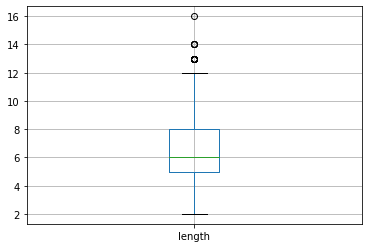

In [17]:
df.boxplot(column=['length'])
plt.show()

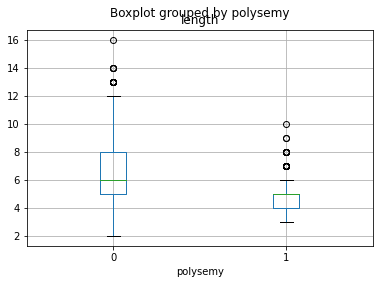

In [18]:
df.boxplot(column=['length'], by='polysemy')
plt.show()

# Altair basic

<b>Chart</b> represents the data and the visualization encodings. Here we associate the first row to a <i>point</i>.

In [19]:
alt.Chart(df.head(1)).mark_point().to_dict()

{'config': {'view': {'continuousWidth': 400, 'continuousHeight': 300}},
 'data': {'name': 'data-446957c9d3beb775b941d0c4290bca6f'},
 'mark': 'point',
 '$schema': 'https://vega.github.io/schema/vega-lite/v4.8.1.json',
 'datasets': {'data-446957c9d3beb775b941d0c4290bca6f': [{'word': 'abattoir',
    'length': 8,
    'arousal': 4.2,
    'valence': 2.864,
    'dominance': 4.333,
    'concreteness': 5.455,
    'imageability': 4.391,
    'familiarity': 2.382,
    'aoa': 6.76,
    'semsize': 4.652,
    'gender': 5.391,
    'polysemy': 0,
    'web_corpus_freq': 160074.0}]}}

For the complete mark list we can digit `alt.Chart.mark_`  followed by TAB

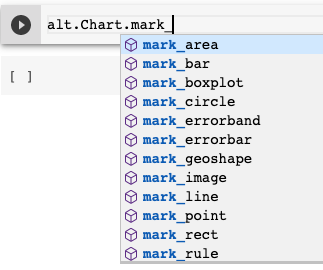


Type	`Code`	*Description*

1. **Quantitative**	`Q`	*Numerical quantity* 
2. **Nominal**	`N`	*Name / Unordered categorical*
3. **Ordinal**	`O`	*Ordered categorial*
4. **Temporal**	`T`	*Date/time*


In [20]:
alt.Chart(df).mark_point()\
  .encode(
      y='length:Q'
      )

alt.Chart(...)

In [21]:
alt.Chart(df)\
  .mark_point()\
  .encode(
      x = alt.X('familiarity:Q'), 
      y = alt.Y('aoa:Q',title='age of acquisition')
      )

alt.Chart(...)

In [22]:
alt.Chart(df)\
  .mark_circle()\
  .encode(
      x = alt.X('familiarity:Q'), 
      y = alt.Y('aoa:Q',title='age of acquisition')
      )

alt.Chart(...)

In [23]:
alt.Chart(df)\
  .mark_circle()\
  .encode(
      x = alt.X('familiarity:Q'), 
      y = alt.Y('aoa:Q',title='age of acquisition'),
      color ='polysemy:N'
      )

alt.Chart(...)

In [24]:
alt.Chart(df).mark_bar(tooltip=True).encode(
    alt.X(
        field='length',
        type='quantitative',
        bin=alt.BinParams(maxbins=10),
        title='length distribution'),
    alt.Y('polysemy:N',aggregate='count', title='Frequency'),
)

alt.Chart(...)

In [25]:
alt.Chart(df).mark_bar(tooltip=True).encode(
    alt.X(
        field='length',
        type='quantitative',
        bin=alt.BinParams(maxbins=10),
        title='length distribution'),
    alt.Y('polysemy:N',aggregate='count', title='Frequency'),
    alt.Color(field='polysemy', type='nominal')
)

alt.Chart(...)

In [26]:
alt.Chart(df).mark_bar(tooltip=True).encode(
    alt.X(field='length',type='quantitative',aggregate='count'),
    alt.Y(
        field='polysemy',
        type='nominal', 
        )
)

alt.Chart(...)

In [27]:
alt.Chart(df).mark_boxplot(size=30,extent=0.5, opacity=0.7).encode(
    x=alt.X(field='aoa',type='quantitative', scale=alt.Scale(zero=False)),
    y='polysemy:N',
    color=alt.Color('polysemy:N',legend=None),
    tooltip='polysemy:N'
).properties(
    width=600,
    height=300
)

alt.Chart(...)

In [28]:
stripplot =  alt.Chart(df, height=40).mark_circle(size=12).encode(
    y=alt.Y(
        'jitter:Q',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    x=alt.X('aoa:Q',title=None,scale=alt.Scale(zero=False)),
    color=alt.Color('polysemy:N', legend=None),
    #tooltip= 'Country:N',
    row=alt.Row(
        'polysemy:N',
        header=alt.Header(
            labelAngle=0,
            titleOrient='top',
            labelOrient='left',
            labelAlign='left',
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
).properties(
    width=600,
)
stripplot

alt.Chart(...)